In [1]:
# imports
import os, sys
import re
import ast
import datetime
import time
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
import csv 
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from keras.layers import Dropout
import re
import nltk
from nltk.corpus import stopwords
from nltk import word_tokenize
STOPWORDS = set(stopwords.words('english'))
from bs4 import BeautifulSoup
import plotly.graph_objs as go
#import plotly.plotly as py
#import cufflinks
from IPython.core.interactiveshell import InteractiveShell
import plotly.figure_factory as ff
InteractiveShell.ast_node_interactivity = 'all'
from plotly.offline import iplot
#cufflinks.go_offline()
#cufflinks.set_config_file(world_readable=True, theme='pearl')

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\tensorflow\python\frame

In [3]:
from googlesearch import search
#from google import google as g
from textblob import TextBlob
import texttable as tt
from time import sleep

In [4]:
filepath = 'C:/Users/asheshchoudhury/Desktop/Capstone/allArticles.txt'

In [5]:
#Train
df=pd.read_csv("C:/Users/asheshchoudhury/Desktop/Capstone-new/w210-final/data/ExtractedTweets.csv")
df.head()
#T =[]
#for i in range(len(df)):
#    T.append(clean_text(df['Tweet'][i]))
#df['Tweet_cleaned'] = T
#df.head()

# Start timer to get total time for running all code
t0 = datetime.datetime.now()

,Party,Handle,Tweet
0,Democrat,RepDarrenSoto,"Today, Senate Dems vote to #SaveTheInternet. P..."
1,Democrat,RepDarrenSoto,RT @WinterHavenSun: Winter Haven resident / Al...
2,Democrat,RepDarrenSoto,RT @NBCLatino: .@RepDarrenSoto noted that Hurr...
3,Democrat,RepDarrenSoto,RT @NALCABPolicy: Meeting with @RepDarrenSoto ...
4,Democrat,RepDarrenSoto,RT @Vegalteno: Hurricane season starts on June...


In [6]:
# The maximum number of words to be used. (most frequent)
MAX_NB_WORDS = 50000
# Max number of words in each complaint.
MAX_SEQUENCE_LENGTH = 250
# This is fixed.
EMBEDDING_DIM = 100

tokenizer = Tokenizer(num_words=MAX_NB_WORDS, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower=True)
tokenizer.fit_on_texts(df['Tweet'])
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))
#X = tokenizer.texts_to_sequences(df['Speech text'])
#X = pad_sequences(X, maxlen=MAX_SEQUENCE_LENGTH)
#print('Shape of data tensor:', X.shape)
df['Party_numeric D=0 R=1'] = np.where(df['Party'] =="Democrat", 0, 1)
df.head()

#X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.20, random_state = 42)
#print(X_train.shape,Y_train.shape)
#print(X_test.shape,Y_test.shape)

Found 140097 unique tokens.


,Party,Handle,Tweet,Party_numeric D=0 R=1
0,Democrat,RepDarrenSoto,"Today, Senate Dems vote to #SaveTheInternet. P...",0
1,Democrat,RepDarrenSoto,RT @WinterHavenSun: Winter Haven resident / Al...,0
2,Democrat,RepDarrenSoto,RT @NBCLatino: .@RepDarrenSoto noted that Hurr...,0
3,Democrat,RepDarrenSoto,RT @NALCABPolicy: Meeting with @RepDarrenSoto ...,0
4,Democrat,RepDarrenSoto,RT @Vegalteno: Hurricane season starts on June...,0


In [7]:
def remove_special_characters(text, remove_digits=False):
    # Remove special characters from text
    pattern = r'[^a-zA-z0-9\s]' if not remove_digits else r'[^a-zA-z\s]'
    text = re.sub(pattern, '', text)
    return text

In [8]:
#import spacy
#nlp = spacy.load('en_core_web_md', parse=True, tag=True, entity=True)


#def lemmatize_text(text):
    # Get base form for word variants (i.e. running ==> run, cats ==> cat, etc.)
#    text = nlp(text)
#    text = ' '.join([word.lemma_ if word.lemma_ != '-PRON-' else word.text for word in text])
#    return text

In [9]:
import nltk
from nltk.tokenize.toktok import ToktokTokenizer

tokenizer1 = ToktokTokenizer()
tokenizer = Tokenizer(num_words=MAX_NB_WORDS, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower=True)

# Remove words 'no' and 'not' from stopword list as these may change meaning of words/phrases
stopword_list = nltk.corpus.stopwords.words('english')
for word in ['no', 'not', 'he', 'she', 'his', 'her', 'hers']:
    stopword_list.remove(word)

# Add characters not captured in special character removal to stop list
stopword_list += ['[', ']', "\\"]                     

def remove_stopwords(text, is_lower_case=False):
    tokens = tokenizer1.tokenize(text)
    tokens = [token.strip() for token in tokens]
    if is_lower_case:
        filtered_tokens = [token for token in tokens if token not in stopword_list]
    else:
        filtered_tokens = [token for token in tokens if token.lower() not in stopword_list]
    filtered_text = ' '.join(filtered_tokens)    
    return filtered_text

In [10]:
import unicodedata

clean_text = []

for text in df['Tweet']:
    # Remove accent characters => Expand Contractions => Remove special characters => Lammatize Text => Remove Stop Words
    no_accent_chars = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    #expanded_text = expand_contractions(no_accent_chars)
    expanded_text = no_accent_chars 
    no_special_chars = remove_special_characters(expanded_text, remove_digits=False)
    #lem_text = lemmatize_text(no_special_chars)
    #filtered_text = remove_stopwords(lem_text)
    filtered_text = remove_stopwords(no_special_chars)
    
    # Make all text lowercase
    lowercase_text = filtered_text.lower()
    
    # Split text into list of words
    words = lowercase_text.split()
    clean_text.append(words)

# Add cleaned text to dataframe
df['clean_tweet'] = clean_text
df.head()

,Party,Handle,Tweet,Party_numeric D=0 R=1,clean_tweet
0,Democrat,RepDarrenSoto,"Today, Senate Dems vote to #SaveTheInternet. P...",0,"[today, senate, dems, vote, savetheinternet, p..."
1,Democrat,RepDarrenSoto,RT @WinterHavenSun: Winter Haven resident / Al...,0,"[rt, winterhavensun, winter, resident, alta, v..."
2,Democrat,RepDarrenSoto,RT @NBCLatino: .@RepDarrenSoto noted that Hurr...,0,"[rt, nbclatino, repdarrensoto, noted, hurrican..."
3,Democrat,RepDarrenSoto,RT @NALCABPolicy: Meeting with @RepDarrenSoto ...,0,"[rt, nalcabpolicy, meeting, repdarrensoto, tha..."
4,Democrat,RepDarrenSoto,RT @Vegalteno: Hurricane season starts on June...,0,"[rt, vegalteno, hurricane, season, starts, jun..."


In [11]:
# Set variables for dependent and independent variables
target = df['Party_numeric D=0 R=1']
data = df['clean_tweet'].values

In [12]:
# Create Bigrams as Certain terms may come up that make more sense together than independently 
from gensim.models import phrases

# Identify and create bigrams
bigrams = phrases.Phrases(data)
bigrams_data = []

for i in range(len(data)):
    bigrams_data.append(bigrams[data[i]])
    
bigrams_data = np.array(bigrams_data)

# Get word count for longest sample after stop words removed and bigrams created
max_len = 0
for bigram in bigrams_data:
    max_len = len(bigram) if len(bigram) > max_len else max_len
    
print(f'Maximum Sample Word Count: {max_len}\n')
#print(f"Sample:\n{' '.join([bigram for bigram in bigrams_data[0]])}")

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\utils.py:1197: UserWarning:

detected Windows; aliasing chunkize to chunkize_serial

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class



C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

Maximum Sample Word Count: 28



C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.models.phrases.Phraser class

C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning:

For a faster implementation, use the gensim.mode

In [13]:
# Create variable to hold set of all unique words in sample corpus
total_vocabulary = set(word for text in bigrams_data for word in text)
print(f'Total Words in Vocabulary: {len(total_vocabulary)}')

Total Words in Vocabulary: 140802


In [14]:
# Create dictionary of vectors from GloVe based on total vocabulary
embeddings_index = {}
f = open('C:/Users/asheshchoudhury/Desktop/Capstone-new/w210-final/data/glove.6B.100d.txt', encoding='utf8')
for line in f:
    values = line.split()
    word = values[0]
    if word in total_vocabulary:
        coefs = np.asarray(values[1:], dtype='float32')
        embeddings_index[word] = coefs
f.close()

print(f'Total Words in Embedding Index: {len(embeddings_index)}')

Total Words in Embedding Index: 32286


In [15]:
class W2vVectorizer(object):
    # Assign GloVe vector to each word in vocabulary, or zero vector to words/bigrams not found
    def __init__(self, w2v):
        # takes in a dictionary of words and vectors as input
        self.w2v = w2v
        if len(w2v) == 0:
            self.dimensions = 0
        else:
            self.dimensions = len(w2v[next(iter(embeddings_index))])
    
    # Following required to allow for implementation of a fit method
    # Cannot be used in SKLearn Pipeline otherwise 
    def fit(self, X, y):
        return self
            
    def transform(self, X):
        return np.array([
            np.mean([self.w2v[w] for w in words if w in self.w2v]
                   or [np.zeros(self.dimensions)], axis=0) for words in X])

In [16]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import GaussianNB


rf  = Pipeline([("Word2Vec Vectorizer", W2vVectorizer(embeddings_index)),
                ("Random Forest", RandomForestClassifier(n_estimators=100, verbose=True, n_jobs=-1))])
svc = Pipeline([("Word2Vec Vectorizer", W2vVectorizer(embeddings_index)),
                ('Support Vector Machine', SVC())])
#lr  = Pipeline([("Word2Vec Vectorizer", W2vVectorizer(embeddings_index)),
#                ('Logistic Regression', LogisticRegression(n_jobs=-1))])
nb =  Pipeline([("Word2Vec Vectorizer", W2vVectorizer(embeddings_index)),
                ('Naive Bayse', GaussianNB())])


In [17]:
models = [('Random Forest', rf),
          ("Support Vector Machine", svc),
#          ("Logistic Regression", lr),
         ("Naive Bayse", nb)]

In [18]:
# Use 2 cross-validations to gauge performance
scores = [(name, cross_val_score(model, data, target, cv=2).mean()) for name, model in models]
scores

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   14.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   27.2s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   11.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   30.9s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.5s finished
C:\Users\asheshchoudhury\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in v

[('Random Forest', 0.6295743696507055),
 ('Support Vector Machine', 0.6187832523710386),
 ('Naive Bayse', 0.5865139949109415)]

In [19]:
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Input, Dense, LSTM, Embedding, GRU
from keras.layers import Dropout, Activation, Bidirectional, GlobalMaxPool1D, Conv1D, MaxPooling1D, Flatten
from keras.models import Model, Sequential, load_model
from keras.metrics import categorical_crossentropy
from keras.preprocessing import text
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.optimizers import Adam, RMSprop

In [20]:
# Convert each sample's list of bigrams into a string
bigrams_joined = []

for a in bigrams_data:
    bigrams_joined.append(' '.join(a))

# Remove underscore from filters and no need to convert to lowercase
tokenizer = text.Tokenizer(filters='!"#%&()*+,./:;<=>?@[\\]^`{|}~\t\n', lower=False)
tokenizer.fit_on_texts(bigrams_joined)
sequences = tokenizer.texts_to_sequences(bigrams_joined)

word_index = tokenizer.word_index
print(f'Total Words in Vocabulary: {len(word_index)}')

Total Words in Vocabulary: 140799


In [21]:
X_t = pad_sequences(sequences, maxlen=max_len, padding='post')
X_t_df = pd.DataFrame(X_t)
X_t_df['bigrams'] = bigrams_data
X_t_df['text'] = df.reset_index(drop=True)['clean_tweet']
X_t_df.head()

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,bigrams,text
0,3,5745,7610,1128,10479,90,26,39724,0,0,...,0,0,0,0,0,0,0,0,"[today, senate_dems, vote_savetheinternet, pro...","[today, senate, dems, vote, savetheinternet, p..."
1,1,24660,3253,2340,24661,7611,1072,22,654,953,...,0,0,0,0,0,0,0,0,"[rt, winterhavensun, winter, resident, alta, v...","[rt, winterhavensun, winter, resident, alta, v..."
2,13621,1354,11387,5510,717,5746,2233,536,8043,11,...,0,0,0,0,0,0,0,0,"[rt_nbclatino, repdarrensoto, noted, hurricane...","[rt, nbclatino, repdarrensoto, noted, hurrican..."
3,1,39725,58,1354,15,1192,188,39726,1951,39727,...,0,0,0,0,0,0,0,0,"[rt, nalcabpolicy, meeting, repdarrensoto, tha...","[rt, nalcabpolicy, meeting, repdarrensoto, tha..."
4,1,39730,7244,1702,2412,680,10480,39731,39732,1354,...,0,0,0,0,0,0,0,0,"[rt, vegalteno, hurricane_season, starts, june...","[rt, vegalteno, hurricane, season, starts, jun..."


In [22]:
# Set target variable
y = pd.get_dummies(target).values

In [23]:
#Train Test split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_t_df, y, test_size=.5)

X_train_text = X_train[['text', 'bigrams']]
X_train = X_train[X_train.columns[:-2]]

X_test_text = X_test[['text', 'bigrams']]
X_test = X_test[X_test.columns[:-2]]


In [24]:
X_test.head()

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
67875,2333,903,2133,1865,1152,3317,153,120177,0,0,...,0,0,0,0,0,0,0,0,0,0
9461,174,2172,2403,1025,164,1116,62,301,62,50922,...,0,0,0,0,0,0,0,0,0,0
6150,768,4536,60,5183,1790,3381,372,2160,5199,470,...,0,0,0,0,0,0,0,0,0,0
29055,1746,308,5716,34228,73912,74,359,6128,73913,0,...,0,0,0,0,0,0,0,0,0,0
80597,154,505,11,665,1332,15399,3356,326,5893,3513,...,0,0,0,0,0,0,0,0,0,0


In [27]:
# Create dictionary of vectors from GloVe based on total vocabulary
#embeddings_index = {}
#f = open('C:/Users/asheshchoudhury/Desktop/Capstone-new/w210-final/data/glove.6B.100d.txt', encoding='utf8')
#for line in f:
#    values = line.split()
#    word = values[0]
#    if word in total_vocabulary:
#        coefs = np.asarray(values[1:], dtype='float32')
#        embeddings_index[word] = coefs
#f.close()

print(f'Total Words in Embedding Index: {len(embeddings_index)}')

Total Words in Embedding Index: 32286


In [28]:
# Create matrix of random vectors which matches size of the word index
embedding_matrix = np.random.random((len(word_index) + 1, 100))
for word, i in word_index.items():
    
    # For each word found in the embedding index, assign the known vector
    embedding_vector = embeddings_index.get(word)
    
    # Otherwise, keep the randomly assigned vector
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector
        
embedding_layer = Embedding(len(word_index) + 1, 
                            100, weights = [embedding_matrix], 
                            input_length = max_len, trainable=True)

In [29]:
# Start from Network Development Strategy Synopsis

In [30]:
#CNN

#def create_cnn_model(cdim=128, ksize=5, pool1=5, pool2=35, density=128, lr=.001, epochs=100, batch_size=128, validation_split=.3, patience=5, verbose=0):
def create_cnn_model(cdim=128, ksize=5, pool1=5, pool2=35, density=128, lr=.001, epochs=5, batch_size=128, validation_split=.2, patience=5, verbose=0):
    
    # Start Timer
    start = datetime.datetime.now()
    
    
    # Display Hyperparameter Settings
    #print('Convolution Dimensions\tWindow Size\tPool 1\t\tPool 2\t\tDensity')
    #print(f'{cdim}\t\t\t{ksize}\t\t{pool1}\t\t{pool2}\t\t{density}')
    
    
    # Build Model
    input_ = Input(shape=(max_len,), dtype='int32')
    embedded_sequences = embedding_layer(input_)
    
    x = Conv1D(cdim, ksize, activation='relu')(embedded_sequences)
    x = MaxPooling1D(pool1, padding='same')(x)
    x = Conv1D(cdim, ksize, activation='relu')(x)
    x = MaxPooling1D(pool1, padding='same')(x)
    x = Conv1D(cdim, ksize, activation='relu')(x)
    x = MaxPooling1D(pool2, padding='same')(x)
    x = Flatten()(x)
    x = Dense(density, activation='relu')(x)
    #x = Dense(num_classes, activation='softmax')(x)
    x = Dense(2, activation='softmax')(x)
    
    model = Model(inputs=input_, outputs=x)
    
    
    # Compile Model
    history = model.compile(loss='categorical_crossentropy', 
                            optimizer=Adam(lr=lr), 
                            metrics=['accuracy'])
    
    # Create Checkpoints & Stopping Parameters
    #checkpoints_path = f'models/cnn_best_{p1}_{p2}.hdf5'
    #checkpoints_path = f'models/cnn_best_.hdf5'

    #checkpoint = ModelCheckpoint(checkpoints_path, 
    #                             monitor='val_loss', 
    #                             verbose=verbose, 
    #                             save_best_only=True, 
    #                             mode='min')

    #early_stopping = EarlyStopping(monitor='val_loss', 
    #                               mode='min', 
    #                               patience=patience)
    
    #callbacks = [checkpoint, early_stopping]
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.001)]
    
    
    # Fit Model
    history = model.fit(X_train, y_train, 
                        epochs=epochs, 
                        batch_size=batch_size, 
                        validation_split=validation_split, 
                        callbacks=callbacks, 
                        verbose=verbose)
    
    # Evaluate Model
    results = model.evaluate(X_test, y_test)
    
    # End Timer
    end = datetime.datetime.now()
    
    # Display Results
    print(f'Time to Complete:\t{end - start}')
    print(f'Loss:\t{results[0]:.2f}\tAccuracy:\t{results[1]:.4f}\n')
    
    return model, history, results, end-start


In [31]:
# Display total time elapsed since program started
t1 = datetime.datetime.now()
print(f'Time Elapsed: {t1 - t0}\n')

# Hyperparameter grid
#cdims = [128, 256]
#ksizes = [3, 5, 7]
#pools1 = [3, 5, 7]
#pools2 = [25, 35]
#densities = [64, 128]

cdims = [8, 16]
ksizes = [3, 5, 7]
pools1 = [3, 5, 7]
pools2 = [5, 10]
densities = [4, 8]



# Create dictionary for tracking CNN results and hyperparameters
cnn_results = {'Convolution Dimensions': [], 
               'Window Size': [], 
               'Pool 1': [], 
               'Pool 2': [], 
               'Density': [], 
               'Time': [], 
               'Loss': [], 
               'Accuracy': []}

for cdim in cdims:
    for ksize in ksizes:
        for pool1 in pools1:
            for pool2 in pools2:
                for density in densities:
                    
                    try:
                        cnn_model, cnn_history, cnn_eval, cnn_time = create_cnn_model(cdim=cdim, 
                                                                                      ksize=ksize, 
                                                                                      pool1=pool1, 
                                                                                      pool2=pool2, 
                                                                                      density=density)
                        cnn_results['Convolution Dimensions'].append(cdim)
                        cnn_results['Window Size'].append(ksize)
                        cnn_results['Pool 1'].append(pool1)
                        cnn_results['Pool 2'].append(pool2)
                        cnn_results['Density'].append(density)
                        cnn_results['Loss'].append(cnn_eval[0])
                        cnn_results['Accuracy'].append(cnn_eval[1])
                        cnn_results['Time'].append(cnn_time)
                        
                    except:
                        # If invalid hyperparameters, pass
                        pass
                    
t2 = datetime.datetime.now()
print(f'Time Elapsed: {t2 - t0}\n')
print(f'Time to Find Best Model: {t2 - t1}\n')

Time Elapsed: 0:18:59.593842

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
43230/43230 [==============================] - 3s 59us/step
Time to Complete:	0:05:55.802971
Loss:	0.91	Accuracy:	0.7243

43230/43230 [==============================] - 3s 61us/step
Time to Complete:	0:04:39.433655
Loss:	1.10	Accuracy:	0.7390

43230/43230 [==============================] - 3s 64us/step
Time to Complete:	0:04:38.825030
Loss:	0.90	Accuracy:	0.7365

43230/43230 [==============================] - 3s 68us/step
Time to Complete:	0:04:41.246053
Loss:	1.19	Accuracy:	0.7409

43230/43230 [==============================] - 3s 75us/step
Time to Complete:	0:04:44.631555
Loss:	1.37	Accuracy:	0.7364

43230/43230 [==============================] - 3s 76us/step
Time to Complete:	0:04:43.392158
Loss:	1.18	Accuracy:	0.7386

43230/43230 [==============================] - 4s 104us/step
Time to Complete:	0:05:34.713753
Loss:	1.16	Accuracy:	0.7

In [32]:
# Train Best CNN Model
# Create dataframe from results dictionary
cnn_results_df = pd.DataFrame.from_dict(cnn_results)

# Get row values associated with highest accuracy
best_cnn_model = cnn_results_df[cnn_results_df['Accuracy'] == cnn_results_df['Accuracy'].max()]

# Save hyperparameters to variables
cdim = best_cnn_model['Convolution Dimensions'].values[0]
ksize = int(best_cnn_model['Window Size'].values[0])
pool1 = int(best_cnn_model['Pool 1'].values[0])
pool2 = int(best_cnn_model['Pool 2'].values[0])
density = int(best_cnn_model['Density'].values[0])

# Rebuild & retrain model with 
cnn_model, cnn_history, cnn_eval, cnn_time = create_cnn_model(cdim=cdim, 
                                                              ksize=ksize, 
                                                              pool1=pool1, 
                                                              pool2=pool2, 
                                                              density=density,
                                                              lr=.001, 
                                                              epochs=100, 
                                                              patience=10, 
                                                              verbose=1)

t3 = datetime.datetime.now()
print(f'Time Elapsed: {t3 - t0}\n')
print(f'Time to Train Best Model: {t3 - t2}\n')


Train on 34584 samples, validate on 8646 samples
Epoch 1/100
34584/34584 [==============================] - 79s 2ms/step - loss: 0.1103 - acc: 0.9536 - val_loss: 1.0333 - val_acc: 0.7446
Epoch 2/100
34584/34584 [==============================] - 79s 2ms/step - loss: 0.0039 - acc: 0.9990 - val_loss: 1.1663 - val_acc: 0.7511
Epoch 3/100
34584/34584 [==============================] - 78s 2ms/step - loss: 0.0033 - acc: 0.9993 - val_loss: 1.2375 - val_acc: 0.7431
Epoch 4/100
43230/43230 [==============================] - 4s 85us/step
Time to Complete:	0:05:17.844423
Loss:	1.26	Accuracy:	0.7458

Time Elapsed: 1:05:11.763155

Time to Train Best Model: 0:05:17.915428



In [34]:
# RNN
#def create_rnn_model(rnn_type='gru', units=50, drop=.5, density=50, lr=.001, epochs=100, batch_size=128, validation_split=.3, patience=5, verbose=0):
def create_rnn_model(rnn_type='gru', units=50, drop=.5, density=50, lr=.001, epochs=5, batch_size=128, validation_split=.2, patience=5, verbose=0):
    
    # Start Timer
    start = datetime.datetime.now()
    
    
    # Display Hyperparameter Settings
    model_type = 'GRU' if rnn_type == 'gru' else 'LSTM'
#    print(f'Model Type:\t{model_type}\tUnits:\t{units}\tDropout Rate:\t{drop}\t\tDensity: {density}')
    
#    tf.logging.set_verbosity(tf.logging.ERROR)
    
    
    # Build Model
    input_ = Input(shape=(max_len,), dtype='int32')
    embedded_sequences = embedding_layer(input_)
    
    if rnn_type == 'gru':
        x = Bidirectional(GRU(units, return_sequences=True))(embedded_sequences)
    else:
        x = Bidirectional(LSTM(units, return_sequences=True))(embedded_sequences)
        
    x = GlobalMaxPool1D()(x)
    x = Dropout(drop)(x)
    x = Dense(density, activation='relu')(x)
    x = Dropout(drop)(x)
    #x = Dense(num_classes, activation='softmax')(x)
    x = Dense(2, activation='softmax')(x)
    
    model = Model(inputs=input_, outputs=x)
    
    
    # Compile Model
    model.compile(loss='categorical_crossentropy', 
                  optimizer=Adam(lr=lr), 
                  metrics=['accuracy'])
    
    
    # Create Checkpoints & Stopping Parameters
    #checkpoints_path = f'models/rnn_best_{p1}_{p2}.hdf5'
#    checkpoints_path = f'models/rnn_best_.hdf'
#    checkpoint = ModelCheckpoint(checkpoints_path, 
#                                 monitor='val_loss', 
#                                 verbose=verbose, 
#                                 save_best_only=True, 
#                                 mode='min')
    
#    early_stopping = EarlyStopping(monitor='val_loss', 
#                                   mode='min', 
#                                   patience=patience)
    
#    callbacks = [checkpoint, early_stopping]
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.001)]
    
    
    # Fit Model
    history = model.fit(X_train, y_train, 
                        epochs=epochs, 
                        batch_size=batch_size, 
                        validation_split=validation_split, 
                        callbacks=callbacks, 
                        verbose=verbose)
    
    # Evaluate Model
    results = model.evaluate(X_test, y_test)
    
    # End Timer
    end = datetime.datetime.now()
    
    # Display Results
    print(f'Time to Complete:\t{end - start}')
    print(f'Loss:\t{results[0]:.2f}\tAccuracy:\t{results[1]:.4f}\n')
    
    return model, history, results, end-start


In [35]:
#RNN grid search
rnn_types = ['lstm', 'gru']
#units = [25, 50]
#drops = [.25, .5]
#densities = [100, 150]

units = [5, 10]
drops = [.25, .5]
densities = [10, 30]

rnn_results = {'Model Type': [], 'Units': [], 'Dropout Rate': [], 'Density': [], 'Time': [], 'Loss': [], 'Accuracy': []}

for rnn_type in rnn_types:
    for unit in units:
        for drop in drops:
            for density in densities:
                rnn_model, rnn_history, rnn_eval, rnn_time = create_rnn_model(rnn_type=rnn_type, 
                                                                              units=unit, 
                                                                              drop=drop, 
                                                                              density=density)
                rnn_results['Model Type'].append(rnn_type)
                rnn_results['Units'].append(unit)
                rnn_results['Dropout Rate'].append(drop)
                rnn_results['Density'].append(density)
                rnn_results['Loss'].append(rnn_eval[0])
                rnn_results['Accuracy'].append(rnn_eval[1])
                rnn_results['Time'].append(rnn_time)
                
t4 = datetime.datetime.now()
print(f'Time Elapsed: {t4 - t0}\n')
print(f'Time to Find Best Model: {t4 - t3}\n')

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.
43230/43230 [==============================] - 11s 251us/step
Time to Complete:	0:06:33.886734
Loss:	1.57	Accuracy:	0.7534

43230/43230 [==============================] - 12s 270us/step
Time to Complete:	0:06:24.358457
Loss:	1.53	Accuracy:	0.7585

43230/43230 [==============================] - 15s 344us/step
Time to Complete:	0:06:17.916857
Loss:	1.51	Accuracy:	0.7542

43230/43230 [==============================] - 12s 281us/step
Time to Complete:	0:06:35.818727
Loss:	1.80	Accuracy:	0.7332

43230/43230 [==============================] - 13s 302us/step
Time to Complete:	0:06:07.880214
Loss:	1.44	Accuracy:	0.7538

43230/43230 [==============================] - 17s 394us/step
Time to Complete:	0:06:56.115862
Loss:	1.37	Accuracy:	0.7678

43230/43230 [==============================] - 14s 324us/step
T

In [36]:
#Train best RNN model 
rnn_results_df = pd.DataFrame.from_dict(rnn_results)

best_rnn_model = rnn_results_df[rnn_results_df['Loss'] == rnn_results_df['Loss'].min()]

rnn_type = best_rnn_model['Model Type'].values[0]
units = int(best_rnn_model['Units'].values[0])
drop = float(best_rnn_model['Dropout Rate'].values[0])
density = int(best_rnn_model['Density'].values[0])

rnn_model, rnn_history, rnn_eval, rnn_time = create_rnn_model(rnn_type=rnn_type, 
                                                              units=units, 
                                                              drop=drop, 
                                                              density=density, 
                                                              lr=.001, 
                                                              epochs=20, 
                                                              patience=10, 
                                                              verbose=1)

t5 = datetime.datetime.now()
print(f'Time Elapsed: {t5 - t0}\n')
print(f'Time to Train Best Model: {t5 - t4}\n')

Train on 34584 samples, validate on 8646 samples
Epoch 1/20
34584/34584 [==============================] - 117s 3ms/step - loss: 0.2102 - acc: 0.9222 - val_loss: 0.7546 - val_acc: 0.7651
Epoch 2/20
34584/34584 [==============================] - 108s 3ms/step - loss: 0.0168 - acc: 0.9978 - val_loss: 0.8882 - val_acc: 0.7696
Epoch 3/20
34584/34584 [==============================] - 110s 3ms/step - loss: 0.0100 - acc: 0.9983 - val_loss: 1.0310 - val_acc: 0.7703
Epoch 4/20
43230/43230 [==============================] - 15s 355us/step
Time to Complete:	0:07:36.522498
Loss:	1.27	Accuracy:	0.7645

Time Elapsed: 3:08:07.377989

Time to Train Best Model: 0:07:37.007110



<Figure size 1080x720 with 0 Axes>

<BarContainer object of 3 artists>

Text(Benchmark: Random Forest, 0.6495743696507055, '62.96%')

Text(CNN, 0.765801526706527, '74.58%')

Text(RNN, 0.7845385149146792, '76.45%')

Text(0, 0.5, 'Accuracy')

(0, 1)

([<matplotlib.axis.YTick at 0x25f952901d0>,
 <a list of 6 Text yticklabel objects>)

Text(0.5, 1.0, 'Top Scores')

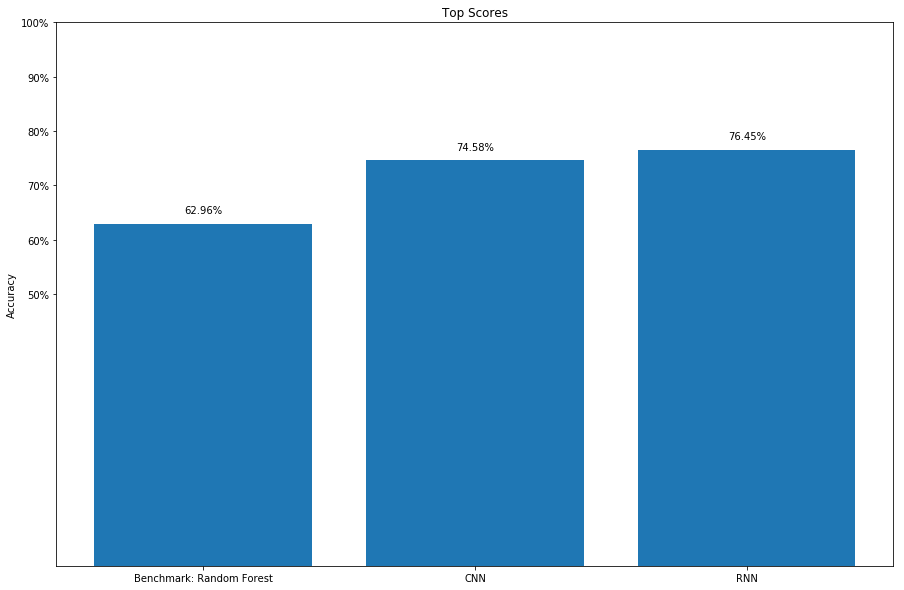

In [37]:
#Visualize results
from operator import itemgetter

labels = [f'Benchmark: {max(scores,key=itemgetter(1))[0]}', 'CNN', 'RNN']
acc = [max(scores,key=itemgetter(1))[1], cnn_eval[1], rnn_eval[1]]

plt.figure(figsize = (15, 10))
plt.bar(labels, acc)
for i in range(3):
    plt.text(labels[i], acc[i] + .02, f'{np.round(acc[i]*100,2)}%', ha='center')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.yticks([i/10 for i in range(5, 11)], [f'{i*10}%' for i in range(5, 11)])
plt.title('Top Scores')
plt.show()

In [38]:
# Inspect Top model performance 
top_models = {'rnn': rnn_model, 'cnn': cnn_model}
histories = {'rnn_hist': rnn_history, 'cnn_hist': cnn_history}
best = 'c' if cnn_eval[1] > rnn_eval[1] else 'r'
best_model = top_models[f'{best}nn']
best_model_hist = histories[f'{best}nn_hist']
print(f'Top Model Type: {best.upper()}NN')
best_model.summary()

Top Model Type: RNN
Model: "model_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_90 (InputLayer)        (None, 28)                0         
_________________________________________________________________
embedding_2 (Embedding)      (None, 28, 100)           14080000  
_________________________________________________________________
bidirectional_17 (Bidirectio (None, 28, 10)            3180      
_________________________________________________________________
global_max_pooling1d_17 (Glo (None, 10)                0         
_________________________________________________________________
dropout_33 (Dropout)         (None, 10)                0         
_________________________________________________________________
dense_51 (Dense)             (None, 10)                110       
_________________________________________________________________
dropout_34 (Dropout)         (None, 10

<Figure size 1080x720 with 0 Axes>

Text(0.5, 1.0, 'RNN Model Accuracy')

Text(0, 0.5, 'RNN Accuracy')

Text(0.5, 0, 'Epoch')

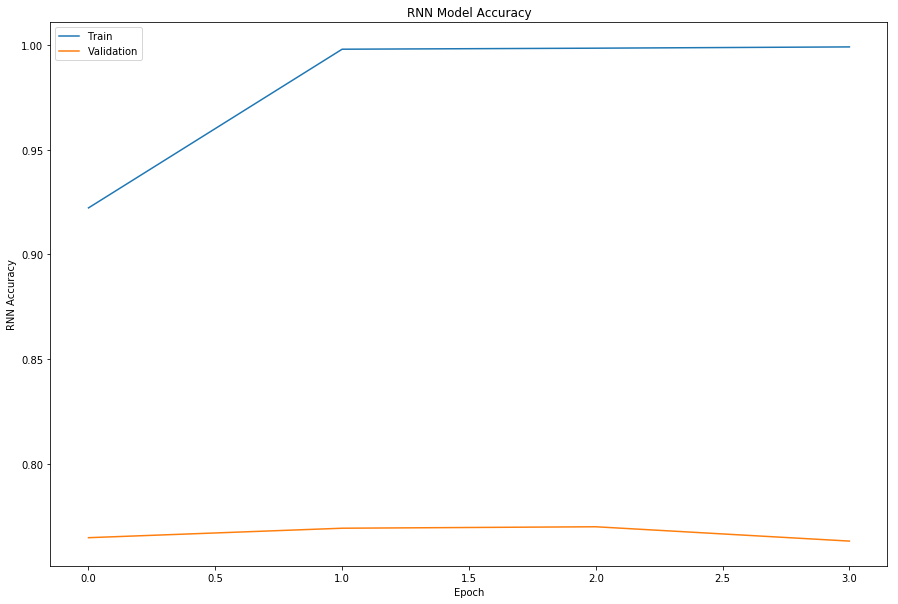

<Figure size 1080x720 with 0 Axes>

Text(0.5, 1.0, 'RNN Model Loss / Error')

Text(0, 0.5, 'RNN Loss / Error')

Text(0.5, 0, 'Epoch')

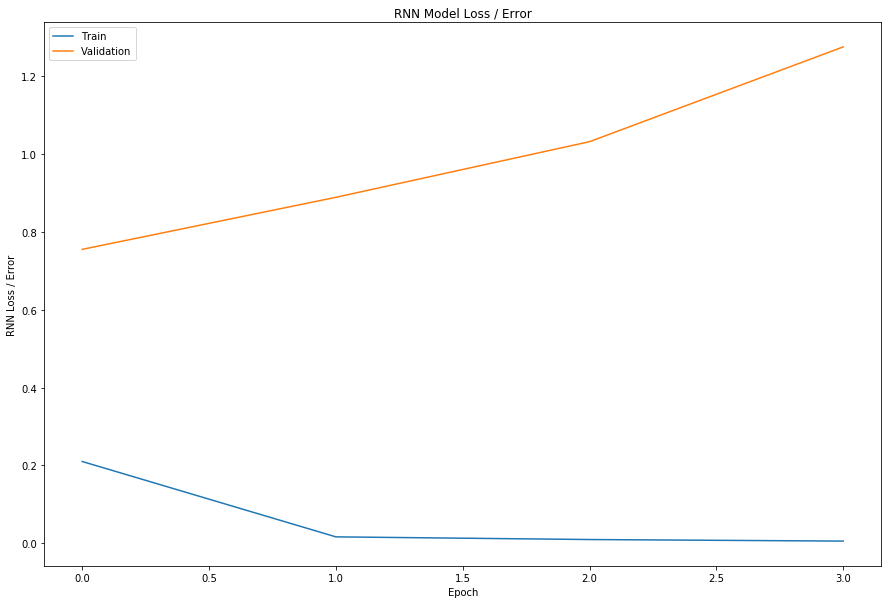

In [39]:
#Results history
# Display history for accuracy
plt.figure(figsize=(15, 10))
plt.plot(best_model_hist.history['acc'])
plt.plot(best_model_hist.history['val_acc'])
plt.title(f'{best.upper()}NN Model Accuracy')
plt.ylabel(f'{best.upper()}NN Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Display history for loss
plt.figure(figsize=(15, 10))
plt.plot(best_model_hist.history['loss'])
plt.plot(best_model_hist.history['val_loss'])
plt.title(f'{best.upper()}NN Model Loss / Error')
plt.ylabel(f'{best.upper()}NN Loss / Error')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [40]:
#Confusion matrix and prediction
from sklearn.metrics import confusion_matrix, f1_score
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.figure(figsize=(10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization
F1 Score: 75.01%


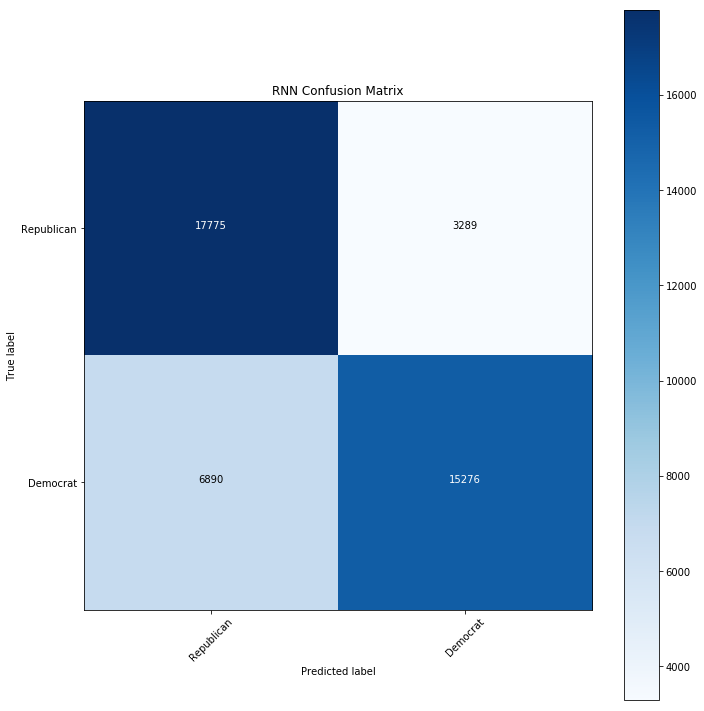

In [41]:
preds = np.argmax(best_model.predict(X_test), axis=1)
actual = np.argmax(y_test, axis=1)

cm = confusion_matrix(actual, preds)

#y_test = actual
#[1,0] = 0;[0,1] =1
#check y and target to confirm this
#(0,1) = 2 (Republican)
#p1 = Repub. P2 = Democ

cm_plot_labels = ['Republican','Democrat']

plot_confusion_matrix(cm, cm_plot_labels, normalize=False, title=f'{best.title()}NN Confusion Matrix')

print(f'F1 Score: {f1_score(actual, preds)*100:.2f}%')

In [42]:
# Save all predictions to dataframe
preds_df = pd.DataFrame.from_dict({'Predictions': preds, 'Actual': actual})
preds_df = preds_df.join(X_test_text.reset_index(drop=True))

# Create column to indicate if the prediction matches the actual
# 0 = Clinton; 1 = Trump
preds_df['Accuracy'] = preds_df['Predictions'] == preds_df['Actual']
preds_df.head()

,Predictions,Actual,text,bigrams,Accuracy
0,1,1,"[nationaldayofprayer, let, us, come, together,...","[nationaldayofprayer, let_us, come_together, p...",True
1,0,0,"[met, owner, mary, shared, she, started, her, ...","[met, owner, mary, shared, she, started, her, ...",True
2,0,0,"[sent, newsletter, yesterday, staying, cyber, ...","[sent, newsletter, yesterday, staying, cyber, ...",True
3,1,0,"[shortly, ill, bloombergtv, sheryahnnews, davi...","[shortly, ill, bloombergtv, sheryahnnews, davi...",False
4,1,1,"[president, trump, along, congress, signed, 25...","[president_trump, along, congress, signed, 25,...",True
